# BetaVAE Beta Sweep Analysis
Train: 2013–2023 | Test: 2024–2026 | K=4 latent factors

Run `python scripts/run_betavae_5k_8b.py` before opening this notebook.

In [1]:
from pathlib import Path
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import seaborn as sns

SWEEP   = next(p / "beta_sweep_k4" for p in [Path(".").resolve(), Path(".").resolve().parent] if (p / "beta_sweep_k4").exists())  # run from results/ or repo root
FACTORS = SWEEP / "factors"
ERRORS  = SWEEP / "errors"

assert ERRORS.exists(), (
    "No beta sweep data found. Run first:\n"
    "  python scripts/run_beta_sweep.py"
)

def _parse_beta(name):
    m = re.search(r"BetaVAE_b([\d.]+)", name)
    return float(m.group(1)) if m else None

# Auto-discover beta variants from saved CSVs
BETA_ARCHS = sorted(
    {f.stem.replace("_train_recon_error", "").replace("_test_recon_error", "")
     for f in ERRORS.glob("BetaVAE_b*_recon_error.csv")},
    key=_parse_beta,
)
BETAS = [_parse_beta(a) for a in BETA_ARCHS]
assert BETA_ARCHS, "No BetaVAE_b* CSV files found in beta_sweep/errors/"
print(f"Found {len(BETA_ARCHS)} beta variants: {BETAS}")

# Load recon errors
train_errors = {
    name: pd.read_csv(ERRORS / f"{name}_train_recon_error.csv", index_col=0, parse_dates=True)
    for name in BETA_ARCHS
}
test_errors = {
    name: pd.read_csv(ERRORS / f"{name}_test_recon_error.csv", index_col=0, parse_dates=True)
    for name in BETA_ARCHS
}

# Per-commodity MSE tables
def mse_table(errors_dict):
    rows = {}
    for name, err in errors_dict.items():
        per_com = (err ** 2).mean()
        per_com["ALL"] = float((err.to_numpy() ** 2).mean())
        rows[name] = per_com
    return pd.DataFrame(rows).T

train_mse_tbl = mse_table(train_errors)
test_mse_tbl  = mse_table(test_errors)

train_mses = [train_mse_tbl.loc[a, "ALL"] for a in BETA_ARCHS]
test_mses  = [test_mse_tbl.loc[a, "ALL"]  for a in BETA_ARCHS]

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/computation/expressions.py:23: UserWarning: Pandas requires version '2.10.2' or newer of 'numexpr' (version '2.8.7' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arrays/masked.py:56: UserWarning: Pandas requires version '1.4.2' or newer of 'bottleneck' (version '1.3.7' currently installed).
  from pandas.core import (


Found 8 beta variants: [0.3, 0.5, 0.8, 1.0, 2.0, 3.0, 4.0, 5.0]


## Summary Table

In [2]:
summary = pd.DataFrame({
    "beta":           BETAS,
    "train_recon_mse": train_mses,
    "test_recon_mse":  test_mses,
    "generalisation_gap": [t - r for r, t in zip(train_mses, test_mses)],
}, index=BETA_ARCHS)
display(summary.round(5))

,beta,train_recon_mse,test_recon_mse,generalisation_gap
BetaVAE_b0.3,0.3,0.67706,0.77332,0.09626
BetaVAE_b0.5,0.5,0.67828,0.77415,0.09587
BetaVAE_b0.8,0.8,0.68596,0.78238,0.09641
BetaVAE_b1,1.0,0.69325,0.79087,0.09762
BetaVAE_b2,2.0,0.75488,0.86440,0.10952
BetaVAE_b3,3.0,0.79854,0.93030,0.13177
BetaVAE_b4,4.0,0.83794,0.99357,0.15563
BetaVAE_b5,5.0,0.86123,1.01807,0.15684


## 1. Reconstruction MSE vs Beta

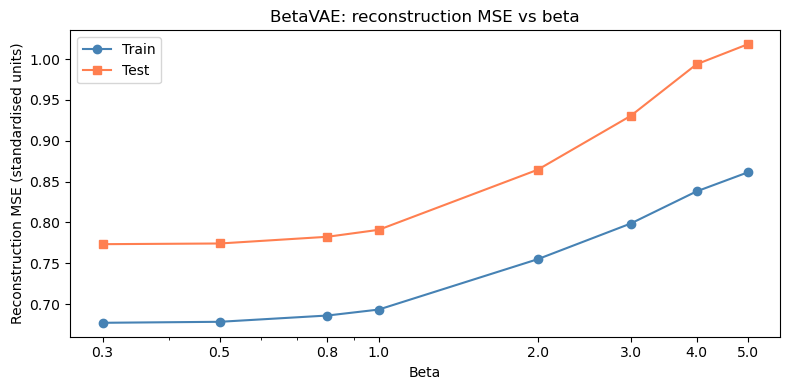

In [3]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(BETAS, train_mses, "o-", label="Train", color="steelblue")
ax.plot(BETAS, test_mses,  "s-", label="Test",  color="coral")
ax.set_xlabel("Beta")
ax.set_ylabel("Reconstruction MSE (standardised units)")
ax.set_title("BetaVAE: reconstruction MSE vs beta")
ax.set_xscale("log")
ax.set_xticks(BETAS)
ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())
ax.legend()
fig.tight_layout()
plt.show()

## 2. Generalisation Gap vs Beta

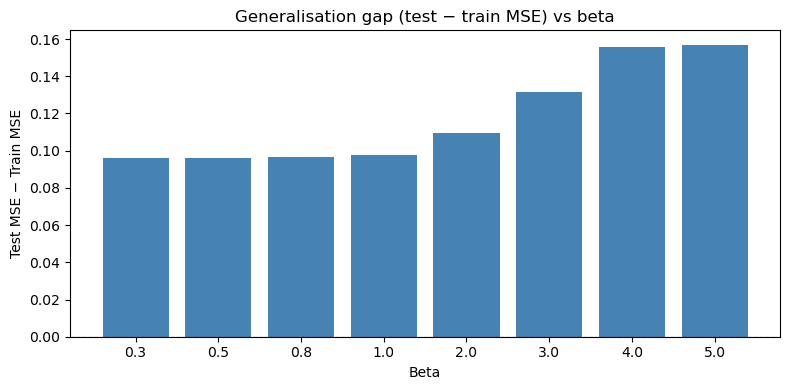

In [4]:
gaps = [t - r for r, t in zip(train_mses, test_mses)]
colors = ["steelblue" if g >= 0 else "crimson" for g in gaps]

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar([str(b) for b in BETAS], gaps, color=colors)
ax.axhline(0, color="k", lw=0.8, ls="--")
ax.set_xlabel("Beta")
ax.set_ylabel("Test MSE − Train MSE")
ax.set_title("Generalisation gap (test − train MSE) vs beta")
fig.tight_layout()
plt.show()

## 3. Per-Commodity MSE Heatmap

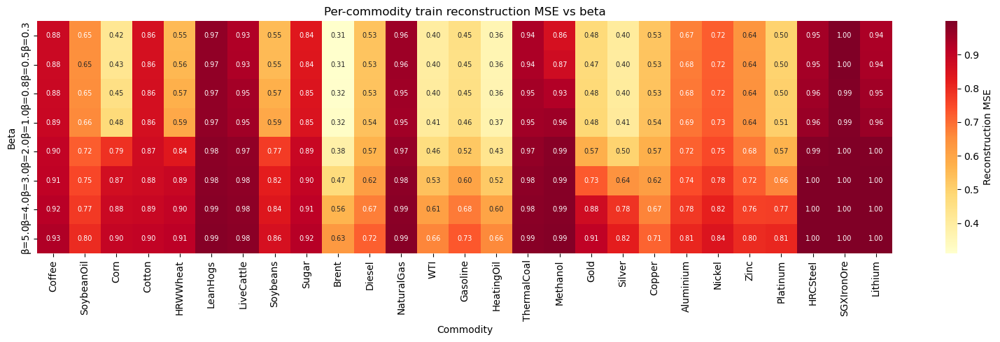

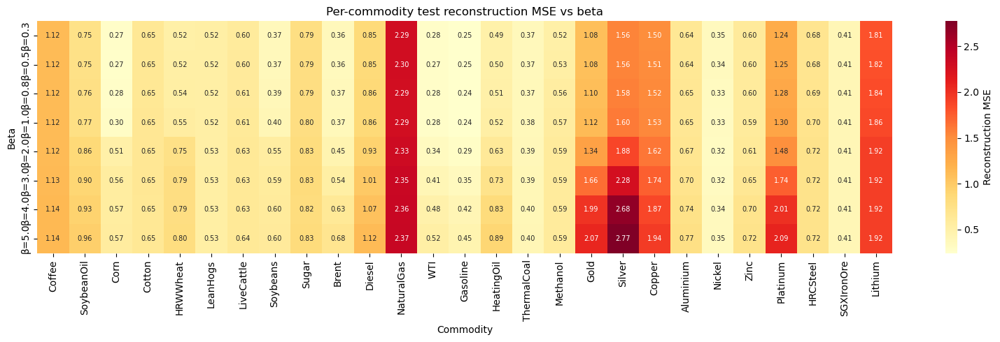

In [5]:
beta_labels = [f"β={b}" for b in BETAS]

for split, tbl in (("train", train_mse_tbl), ("test", test_mse_tbl)):
    data = tbl.drop(columns="ALL").rename(index=dict(zip(BETA_ARCHS, beta_labels)))
    fig, ax = plt.subplots(figsize=(16, 5))
    sns.heatmap(
        data, cmap="YlOrRd", annot=True, fmt=".2f",
        annot_kws={"size": 7}, cbar_kws={"label": "Reconstruction MSE"}, ax=ax,
    )
    ax.set_title(f"Per-commodity {split} reconstruction MSE vs beta")
    ax.set_xlabel("Commodity")
    ax.set_ylabel("Beta")
    fig.tight_layout()
    plt.show()

## 4. Factor Variances vs Beta

Low variance on a factor means the encoder has collapsed that dimension toward zero — the KL penalty at high beta forces the latent code toward the prior, killing information.

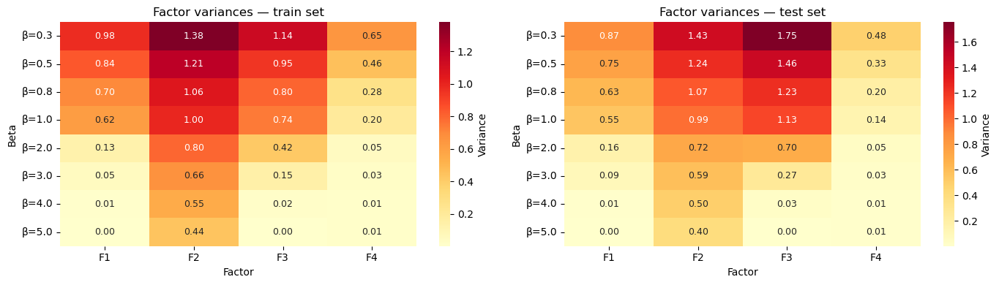

In [6]:
def load_factor_var(arch, split):
    return pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True).var()

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for ax, split in zip(axes, ("train", "test")):
    var_matrix = pd.DataFrame(
        {f"β={b}": load_factor_var(a, split) for a, b in zip(BETA_ARCHS, BETAS)}
    ).T
    sns.heatmap(
        var_matrix, cmap="YlOrRd", annot=True, fmt=".2f",
        annot_kws={"size": 9}, ax=ax, cbar_kws={"label": "Variance"},
    )
    ax.set_title(f"Factor variances — {split} set")
    ax.set_xlabel("Factor")
    ax.set_ylabel("Beta")
fig.tight_layout()
plt.show()

## 5. Active Factor Count vs Beta

A factor is "active" if its variance exceeds a threshold (0.1). Shows how many dimensions the encoder uses at each beta.

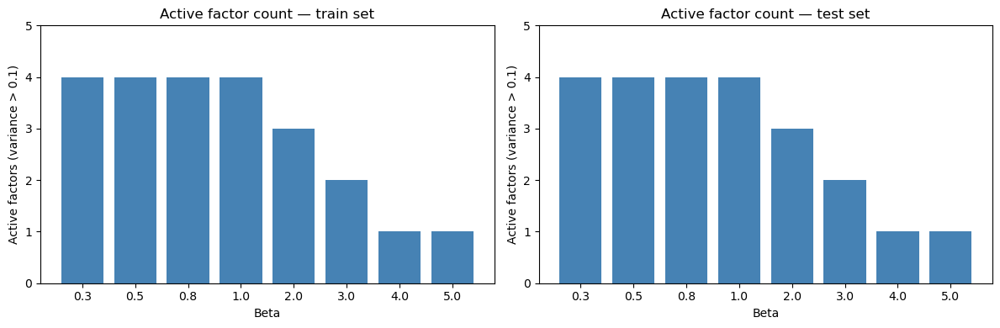

In [7]:
THRESHOLD = 0.1

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, split in zip(axes, ("train", "test")):
    active_counts = [
        int((load_factor_var(a, split) > THRESHOLD).sum())
        for a in BETA_ARCHS
    ]
    ax.bar([str(b) for b in BETAS], active_counts, color="steelblue")
    ax.set_ylim(0, max(active_counts) + 1)
    ax.set_xlabel("Beta")
    ax.set_ylabel(f"Active factors (variance > {THRESHOLD})")
    ax.set_title(f"Active factor count — {split} set")
fig.tight_layout()
plt.show()

## 6. Factor Time Series

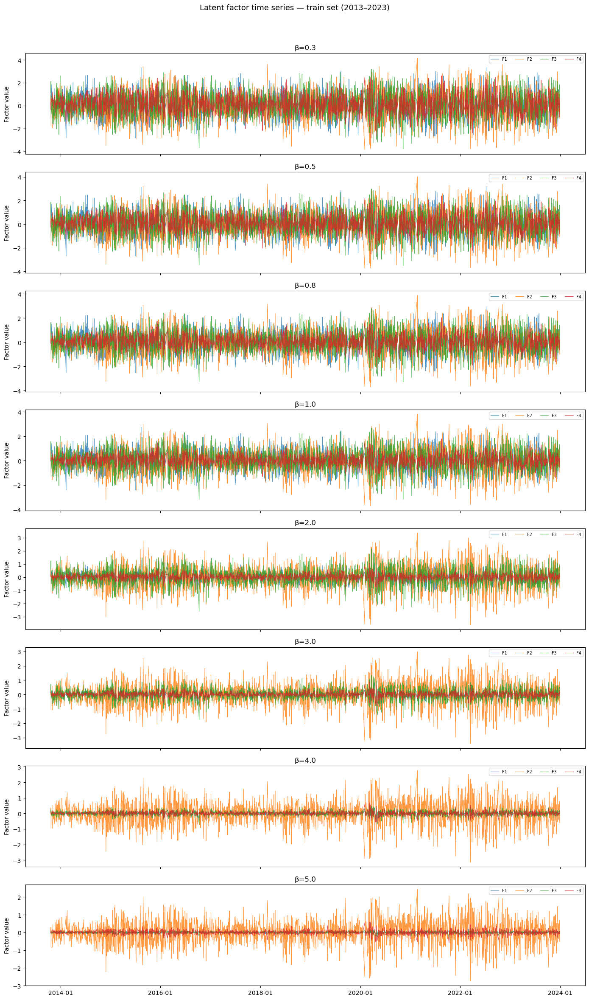

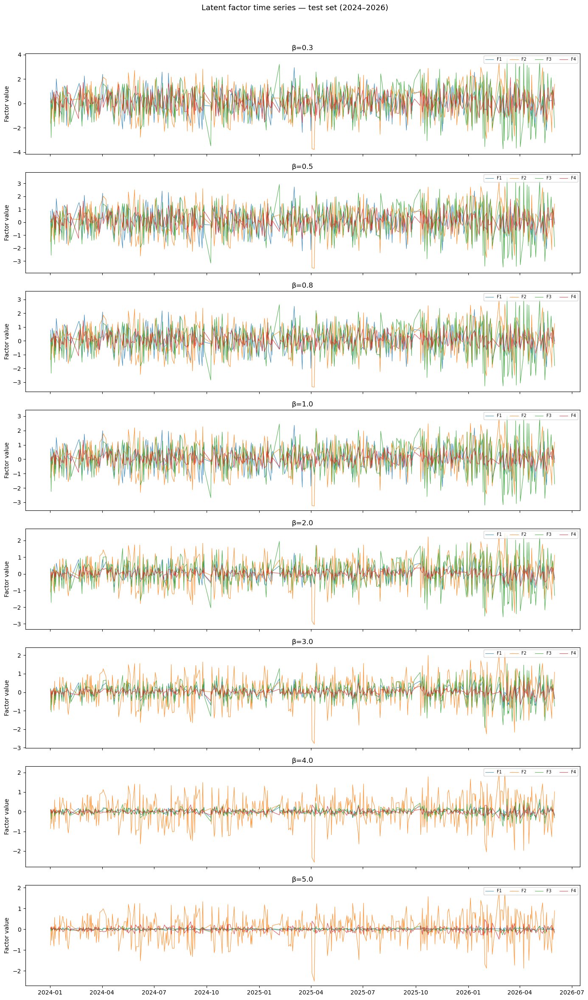

In [8]:
for split in ("train", "test"):
    n = len(BETA_ARCHS)
    fig, axes = plt.subplots(n, 1, figsize=(14, 3 * n), sharex=True)
    if n == 1:
        axes = [axes]
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
        for col in factors.columns:
            ax.plot(factors.index, factors[col], lw=0.8, alpha=0.8, label=col)
        ax.set_title(f"β={beta}")
        ax.set_ylabel("Factor value")
        ax.legend(loc="upper right", fontsize=7, ncol=5)
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    year_range = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(f"Latent factor time series — {split} set ({year_range})", fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

## 7. R² Explained per Beta

R² = 1 − MSE (valid because input is z-scored, so baseline variance = 1 per commodity).  
RMSE = √MSE.  
Higher β → stronger KL penalty → factors compressed toward prior → reconstruction worsens → lower R².

In [9]:
_SECTOR_MAP = {
    "Brent":"Energy","WTI":"Energy","NaturalGas":"Energy","Gasoline":"Energy",
    "Diesel":"Energy","HeatingOil":"Energy","ThermalCoal":"Energy","Methanol":"Energy",
    "Gold":"Metals","Silver":"Metals","Copper":"Metals","Aluminium":"Metals",
    "Nickel":"Metals","Zinc":"Metals","Platinum":"Metals","HRCSteel":"Metals",
    "SGXIronOre":"Metals","Lithium":"Metals",
    "Coffee":"Agriculture","Corn":"Agriculture","Cotton":"Agriculture",
    "LeanHogs":"Agriculture","LiveCattle":"Agriculture","Sugar":"Agriculture",
    "Soybeans":"Agriculture","SoybeanOil":"Agriculture","HRWWheat":"Agriculture",
}
_SECTOR_ORDER = ["Energy", "Metals", "Agriculture"]
beta_labels   = [f"β={b}" for b in BETAS]

def _metrics_df(mse_tbl):
    rows = []
    for arch in BETA_ARCHS:
        for com in mse_tbl.drop(columns="ALL").columns:
            mse = mse_tbl.loc[arch, com]
            rows.append({
                "beta_arch": arch,
                "commodity": com,
                "sector":    _SECTOR_MAP.get(com, "?"),
                "MSE":       mse,
                "RMSE":      np.sqrt(mse),
                "R2":        1.0 - mse,
            })
    return pd.DataFrame(rows)

train_metrics = _metrics_df(train_mse_tbl)
test_metrics  = _metrics_df(test_mse_tbl)

for label, df in [("Train (2013–2023)", train_metrics), ("Test (2024–2026)", test_metrics)]:
    print(f"\n{'═'*60}")
    print(f"  {label}")
    print(f"{'═'*60}")

    overall = df.groupby("beta_arch")[["MSE","RMSE","R2"]].mean().loc[BETA_ARCHS]
    overall.index = beta_labels
    print("\n— Overall —")
    display(overall.round(4))

    sector_tbl = (
        df.groupby(["beta_arch","sector"])[["MSE","RMSE","R2"]]
        .mean()
        .unstack("sector")
        .loc[BETA_ARCHS]
        .reindex(columns=pd.MultiIndex.from_product([["MSE","RMSE","R2"], _SECTOR_ORDER]))
    )
    sector_tbl.index = beta_labels
    print("\n— Per sector —")
    display(sector_tbl.round(4))


════════════════════════════════════════════════════════════
  Train (2013–2023)
════════════════════════════════════════════════════════════

— Overall —


,MSE,RMSE,R2
β=0.3,0.6771,0.8111,0.3229
β=0.5,0.6783,0.8118,0.3217
β=0.8,0.6860,0.8166,0.3140
β=1.0,0.6933,0.8212,0.3067
β=2.0,0.7549,0.8606,0.2451
β=3.0,0.7985,0.8884,0.2015
β=4.0,0.8379,0.9123,0.1621
β=5.0,0.8612,0.9258,0.1388



— Per sector —


MSE                        RMSE                          R2          \
       Energy  Metals Agriculture  Energy  Metals Agriculture  Energy  Metals   
β=0.3  0.6006  0.6815      0.7400  0.7578  0.8163      0.8528  0.3994  0.3185   
β=0.5  0.6020  0.6823      0.7416  0.7584  0.8167      0.8539  0.3980  0.3177   
β=0.8  0.6118  0.6867      0.7511  0.7642  0.8194      0.8601  0.3882  0.3133   
β=1.0  0.6192  0.6913      0.7613  0.7690  0.8222      0.8666  0.3808  0.3087   
β=2.0  0.6624  0.7348      0.8594  0.7999  0.8505      0.9259  0.3376  0.2652   
β=3.0  0.7113  0.7894      0.8862  0.8340  0.8849      0.9407  0.2887  0.2106   
β=4.0  0.7619  0.8454      0.8973  0.8671  0.9175      0.9467  0.2381  0.1546   
β=5.0  0.7958  0.8698      0.9098  0.8880  0.9312      0.9534  0.2042  0.1302   

                   
      Agriculture  
β=0.3      0.2600  
β=0.5      0.2584  
β=0.8      0.2489  
β=1.0      0.2387  
β=2.0      0.1406  
β=3.0      0.1138  
β=4.0      0.1027  
β=5.0      0.0902


════════════════════════════════════════════════════════════
  Test (2024–2026)
════════════════════════════════════════════════════════════

— Overall —


,MSE,RMSE,R2
β=0.3,0.7733,0.8394,0.2267
β=0.5,0.7741,0.8396,0.2259
β=0.8,0.7824,0.8443,0.2176
β=1.0,0.7909,0.8493,0.2091
β=2.0,0.8644,0.8913,0.1356
β=3.0,0.9303,0.9233,0.0697
β=4.0,0.9936,0.9515,0.0064
β=5.0,1.0181,0.9630,-0.0181



— Per sector —


MSE                        RMSE                          R2          \
       Energy  Metals Agriculture  Energy  Metals Agriculture  Energy  Metals   
β=0.3  0.6771  0.9883      0.6200  0.7620  0.9609      0.7731  0.3229  0.0117   
β=0.5  0.6772  0.9898      0.6208  0.7617  0.9613      0.7736  0.3228  0.0102   
β=0.8  0.6836  1.0002      0.6281  0.7664  0.9655      0.7790  0.3164 -0.0002   
β=1.0  0.6898  1.0107      0.6364  0.7711  0.9698      0.7850  0.3102 -0.0107   
β=2.0  0.7429  1.0968      0.7141  0.8080  1.0057      0.8383  0.2571 -0.0968   
β=3.0  0.7959  1.2151      0.7333  0.8439  1.0526      0.8501  0.2041 -0.2151   
β=4.0  0.8488  1.3380      0.7396  0.8777  1.0987      0.8536  0.1512 -0.3380   
β=5.0  0.8774  1.3762      0.7452  0.8949  1.1133      0.8566  0.1226 -0.3762   

                   
      Agriculture  
β=0.3      0.3800  
β=0.5      0.3792  
β=0.8      0.3719  
β=1.0      0.3636  
β=2.0      0.2859  
β=3.0      0.2667  
β=4.0      0.2604  
β=5.0      0.2548

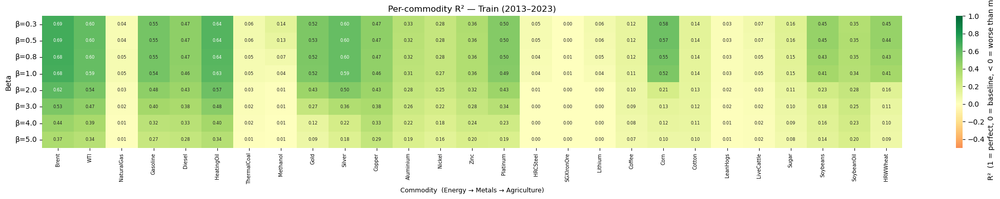

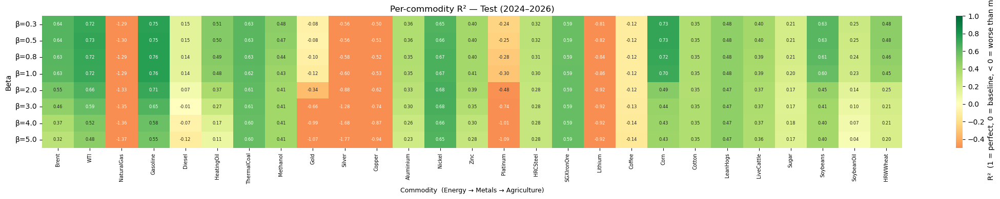

In [10]:
_COMMODITIES_ORDERED = sorted(
    _SECTOR_MAP,
    key=lambda c: (_SECTOR_ORDER.index(_SECTOR_MAP[c]), list(_SECTOR_MAP).index(c)),
)

for label, metrics in [("Train (2013–2023)", train_metrics), ("Test (2024–2026)", test_metrics)]:
    r2_wide = (
        metrics.pivot(index="beta_arch", columns="commodity", values="R2")
        .loc[BETA_ARCHS, _COMMODITIES_ORDERED]
    )
    r2_wide.index = beta_labels
    fig, ax = plt.subplots(figsize=(22, 4))
    sns.heatmap(
        r2_wide,
        cmap="RdYlGn", center=0, vmin=-0.5, vmax=1.0,
        annot=True, fmt=".2f", annot_kws={"size": 6},
        cbar_kws={"label": "R²  (1 = perfect, 0 = baseline, < 0 = worse than mean)"},
        ax=ax,
    )
    ax.set_title(f"Per-commodity R² — {label}", fontsize=12)
    ax.set_xlabel("Commodity  (Energy → Metals → Agriculture)", fontsize=9)
    ax.set_ylabel("Beta")
    ax.tick_params(axis="x", rotation=90, labelsize=7)
    fig.tight_layout()
    plt.show()

## 8. Factor Correlation Heatmaps

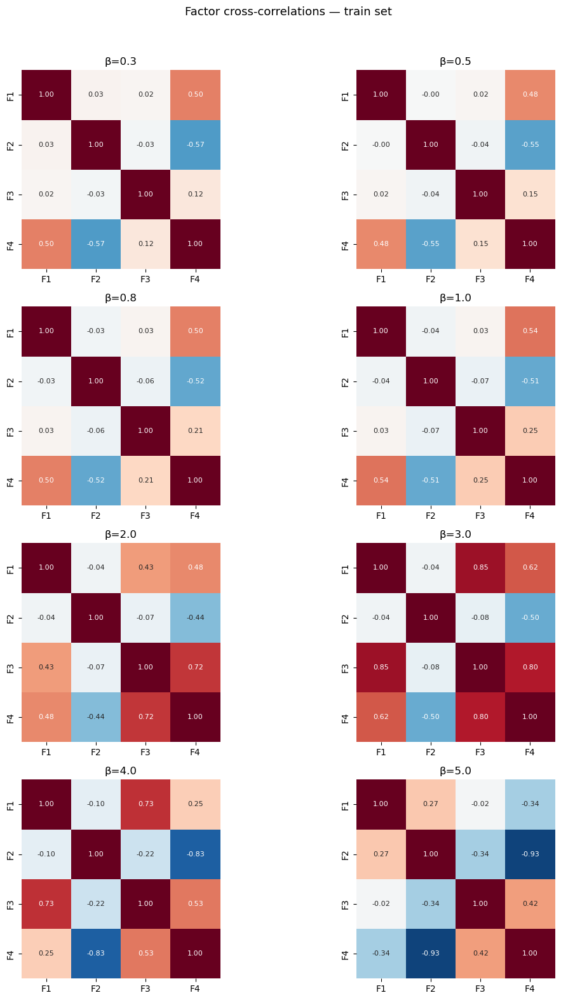

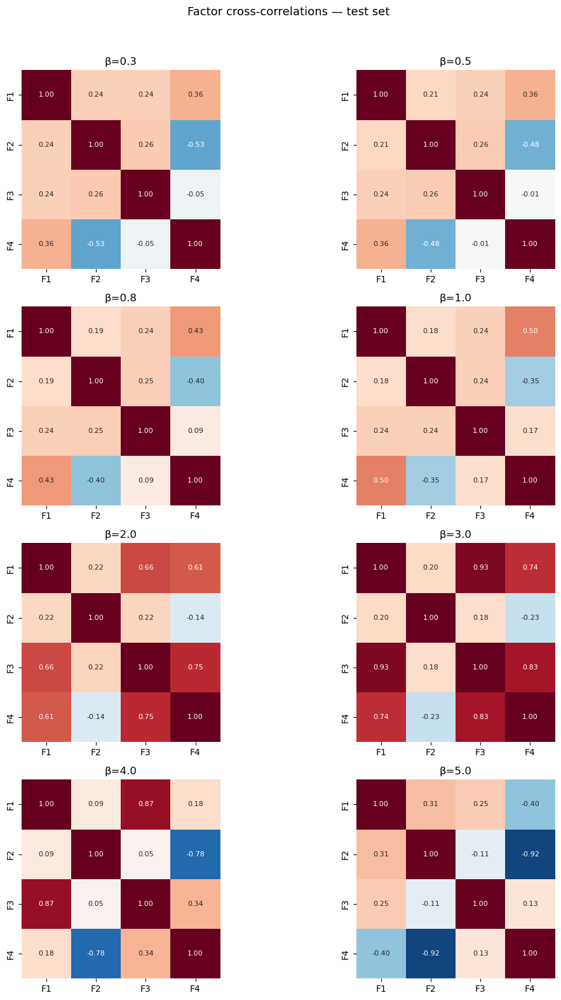

In [11]:
n = len(BETA_ARCHS)
ncols = 2
nrows = (n + 1) // ncols

for split in ("train", "test"):
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4 * nrows))
    axes = axes.flatten()
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
        sns.heatmap(
            factors.corr(), ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
            annot=True, fmt=".2f", annot_kws={"size": 8}, square=True, cbar=False,
        )
        ax.set_title(f"β={beta}")
    for ax in axes[n:]:
        ax.set_visible(False)
    fig.suptitle(f"Factor cross-correlations — {split} set", fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

## 9. Latent Factor Interpretation

For each beta value, we compute the **correlation between each latent factor and each commodity return** — the autoencoder equivalent of PCA loadings. Higher β values are expected to produce more disentangled but less commodity-specific factors as the KL penalty pushes the posterior toward a structureless prior.

In [12]:
returns_raw = pd.read_csv("../data/returns.csv", index_col=0, parse_dates=True)

SECTOR_MAP = {
    "Brent":"Energy","WTI":"Energy","NaturalGas":"Energy","Gasoline":"Energy",
    "Diesel":"Energy","HeatingOil":"Energy","ThermalCoal":"Energy","Methanol":"Energy",
    "Gold":"Metals","Silver":"Metals","Copper":"Metals","Aluminium":"Metals",
    "Nickel":"Metals","Zinc":"Metals","Platinum":"Metals","HRCSteel":"Metals",
    "SGXIronOre":"Metals","Lithium":"Metals",
    "Coffee":"Agriculture","Corn":"Agriculture","Cotton":"Agriculture",
    "LeanHogs":"Agriculture","LiveCattle":"Agriculture","Sugar":"Agriculture",
    "Soybeans":"Agriculture","SoybeanOil":"Agriculture","HRWWheat":"Agriculture",
}
SECTOR_ORDER = ["Energy", "Metals", "Agriculture"]
COMMODITIES_ORDERED = sorted(
    SECTOR_MAP, key=lambda c: (SECTOR_ORDER.index(SECTOR_MAP[c]), list(SECTOR_MAP).index(c))
)

def factor_commodity_corr(arch, split):
    factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
    rets    = returns_raw.reindex(factors.index)[COMMODITIES_ORDERED]
    return pd.DataFrame(
        {col: factors.corrwith(rets[col]) for col in rets.columns},
        index=factors.columns,
    )

### 9a. Factor–commodity correlation heatmaps (train then test)

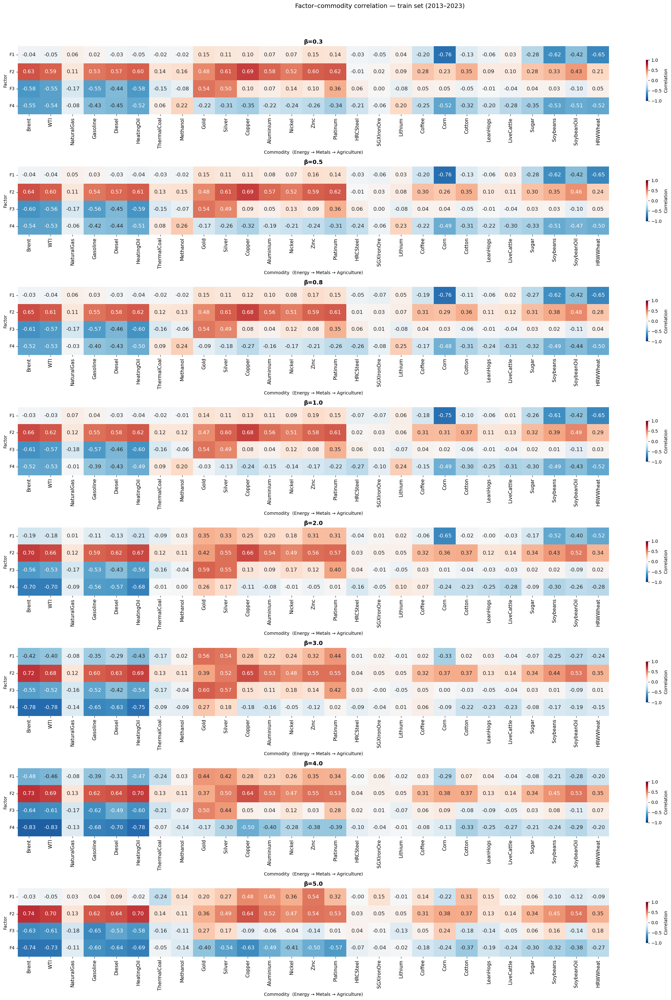

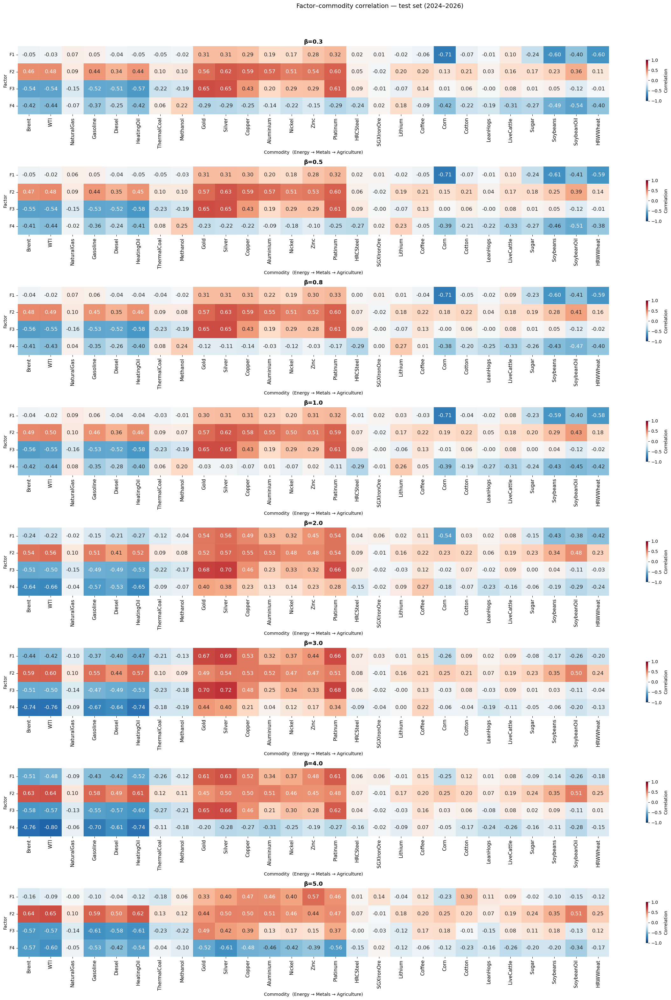

In [23]:
for split in ("train", "test"):
    nb = len(BETA_ARCHS)
    fig, axes = plt.subplots(nb, 1, figsize=(24, 4 * nb))
    if nb == 1:
        axes = [axes]
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        corr = factor_commodity_corr(arch, split)
        sns.heatmap(
            corr, ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
            annot=True, fmt=".2f", annot_kws={"size": 12},
            xticklabels=corr.columns, yticklabels=corr.index, cbar=True,
            cbar_kws={"label": "Correlation", "shrink": 0.6},
        )
        ax.set_title(f"β={beta}", fontsize=13, fontweight="bold")
        ax.set_xlabel("Commodity  (Energy → Metals → Agriculture)", fontsize=10)
        ax.set_ylabel("Factor", fontsize=10)
        ax.tick_params(axis="x", rotation=90, labelsize=11)
        ax.tick_params(axis="y", rotation=0,  labelsize=10)
    year = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(f"Factor–commodity correlation — {split} set ({year})", fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

### 9b. Top commodities per factor (train, by absolute correlation)

In [14]:
TOP_N = 5
for arch, beta in zip(BETA_ARCHS, BETAS):
    corr = factor_commodity_corr(arch, "train")
    rows = []
    for factor in corr.index:
        top = corr.loc[factor].abs().nlargest(TOP_N)
        for rank, (com, _) in enumerate(top.items(), 1):
            rows.append({
                "factor":      factor,
                "rank":        rank,
                "commodity":   com,
                "sector":      SECTOR_MAP[com],
                "correlation": round(corr.loc[factor, com], 3),
            })
    tbl = pd.DataFrame(rows).set_index(["factor", "rank"])
    print(f"\n{'─' * 60}")
    print(f"  β={beta} — top {TOP_N} commodities per factor (train, |corr|)")
    print(f"{'─' * 60}")
    display(tbl)


────────────────────────────────────────────────────────────
  β=0.3 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1           Corn  Agriculture       -0.757
       2       HRWWheat  Agriculture       -0.654
       3       Soybeans  Agriculture       -0.621
       4     SoybeanOil  Agriculture       -0.419
       5          Sugar  Agriculture       -0.283
F2     1         Copper       Metals        0.693
       2          Brent       Energy        0.633
       3       Platinum       Metals        0.617
       4         Silver       Metals        0.609
       5           Zinc       Metals        0.602
F3     1          Brent       Energy       -0.584
       2     HeatingOil       Energy       -0.576
       3       Gasoline       Energy       -0.552
       4            WTI       Energy       -0.546
       5           Gold       Metals        0.544
F4     1          Brent       Energy       -0.549
       2            WTI       Energy       -0.543
       3       Soybeans  Agriculture       -0.534
       4           Corn  Agriculture       -0.525
       5     HeatingOil       Energy       -0.519


────────────────────────────────────────────────────────────
  β=0.5 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1           Corn  Agriculture       -0.759
       2       HRWWheat  Agriculture       -0.655
       3       Soybeans  Agriculture       -0.623
       4     SoybeanOil  Agriculture       -0.423
       5          Sugar  Agriculture       -0.276
F2     1         Copper       Metals        0.689
       2          Brent       Energy        0.641
       3       Platinum       Metals        0.617
       4         Silver       Metals        0.611
       5     HeatingOil       Energy        0.606
F3     1          Brent       Energy       -0.596
       2     HeatingOil       Energy       -0.588
       3       Gasoline       Energy       -0.562
       4            WTI       Energy       -0.558
       5           Gold       Metals        0.539
F4     1          Brent       Energy       -0.536
       2            WTI       Energy       -0.533
       3     HeatingOil       Energy       -0.506
       4       Soybeans  Agriculture       -0.505
       5       HRWWheat  Agriculture       -0.500


────────────────────────────────────────────────────────────
  β=0.8 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1           Corn  Agriculture       -0.757
       2       HRWWheat  Agriculture       -0.653
       3       Soybeans  Agriculture       -0.617
       4     SoybeanOil  Agriculture       -0.421
       5          Sugar  Agriculture       -0.268
F2     1         Copper       Metals        0.684
       2          Brent       Energy        0.651
       3     HeatingOil       Energy        0.616
       4       Platinum       Metals        0.614
       5            WTI       Energy        0.611
F3     1          Brent       Energy       -0.605
       2     HeatingOil       Energy       -0.597
       3       Gasoline       Energy       -0.570
       4            WTI       Energy       -0.567
       5           Gold       Metals        0.537
F4     1            WTI       Energy       -0.525
       2          Brent       Energy       -0.524
       3       HRWWheat  Agriculture       -0.502
       4     HeatingOil       Energy       -0.495
       5       Soybeans  Agriculture       -0.490


────────────────────────────────────────────────────────────
  β=1.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1           Corn  Agriculture       -0.755
       2       HRWWheat  Agriculture       -0.650
       3       Soybeans  Agriculture       -0.612
       4     SoybeanOil  Agriculture       -0.416
       5          Sugar  Agriculture       -0.261
F2     1         Copper       Metals        0.680
       2          Brent       Energy        0.658
       3     HeatingOil       Energy        0.624
       4            WTI       Energy        0.619
       5       Platinum       Metals        0.610
F3     1          Brent       Energy       -0.606
       2     HeatingOil       Energy       -0.599
       3       Gasoline       Energy       -0.570
       4            WTI       Energy       -0.567
       5           Gold       Metals        0.539
F4     1            WTI       Energy       -0.525
       2          Brent       Energy       -0.522
       3       HRWWheat  Agriculture       -0.516
       4     HeatingOil       Energy       -0.494
       5       Soybeans  Agriculture       -0.494


────────────────────────────────────────────────────────────
  β=2.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1           Corn  Agriculture       -0.647
       2       Soybeans  Agriculture       -0.523
       3       HRWWheat  Agriculture       -0.520
       4     SoybeanOil  Agriculture       -0.403
       5           Gold       Metals        0.353
F2     1          Brent       Energy        0.701
       2     HeatingOil       Energy        0.666
       3            WTI       Energy        0.661
       4         Copper       Metals        0.659
       5         Diesel       Energy        0.617
F3     1           Gold       Metals        0.589
       2          Brent       Energy       -0.564
       3     HeatingOil       Energy       -0.556
       4         Silver       Metals        0.549
       5       Gasoline       Energy       -0.534
F4     1          Brent       Energy       -0.702
       2            WTI       Energy       -0.701
       3     HeatingOil       Energy       -0.678
       4         Diesel       Energy       -0.569
       5       Gasoline       Energy       -0.559


────────────────────────────────────────────────────────────
  β=3.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity  sector  correlation
factor rank                                 
F1     1           Gold  Metals        0.562
       2         Silver  Metals        0.538
       3       Platinum  Metals        0.438
       4     HeatingOil  Energy       -0.431
       5          Brent  Energy       -0.423
F2     1          Brent  Energy        0.720
       2     HeatingOil  Energy        0.686
       3            WTI  Energy        0.679
       4         Copper  Metals        0.649
       5         Diesel  Energy        0.631
F3     1           Gold  Metals        0.603
       2         Silver  Metals        0.565
       3          Brent  Energy       -0.550
       4     HeatingOil  Energy       -0.538
       5       Gasoline  Energy       -0.524
F4     1          Brent  Energy       -0.780
       2            WTI  Energy       -0.777
       3     HeatingOil  Energy       -0.748
       4       Gasoline  Energy       -0.649
       5         Diesel  Energy       -0.627


────────────────────────────────────────────────────────────
  β=4.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity  sector  correlation
factor rank                                 
F1     1          Brent  Energy       -0.483
       2     HeatingOil  Energy       -0.470
       3            WTI  Energy       -0.459
       4           Gold  Metals        0.438
       5         Silver  Metals        0.422
F2     1          Brent  Energy        0.733
       2     HeatingOil  Energy        0.700
       3            WTI  Energy        0.692
       4         Copper  Metals        0.641
       5         Diesel  Energy        0.640
F3     1          Brent  Energy       -0.635
       2       Gasoline  Energy       -0.615
       3            WTI  Energy       -0.611
       4     HeatingOil  Energy       -0.603
       5           Gold  Metals        0.498
F4     1            WTI  Energy       -0.828
       2          Brent  Energy       -0.826
       3     HeatingOil  Energy       -0.778
       4         Diesel  Energy       -0.701
       5       Gasoline  Energy       -0.677


────────────────────────────────────────────────────────────
  β=5.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity  sector  correlation
factor rank                                 
F1     1           Zinc  Metals        0.539
       2         Copper  Metals        0.479
       3      Aluminium  Metals        0.445
       4         Nickel  Metals        0.361
       5       Platinum  Metals        0.316
F2     1          Brent  Energy        0.736
       2     HeatingOil  Energy        0.704
       3            WTI  Energy        0.695
       4         Diesel  Energy        0.642
       5         Copper  Metals        0.637
F3     1       Gasoline  Energy       -0.647
       2          Brent  Energy       -0.626
       3            WTI  Energy       -0.606
       4     HeatingOil  Energy       -0.585
       5         Diesel  Energy       -0.526
F4     1          Brent  Energy       -0.736
       2            WTI  Energy       -0.733
       3     HeatingOil  Energy       -0.692
       4         Diesel  Energy       -0.642
       5         Copper  Metals       -0.625

### 9c. Factor–sector alignment (mean |correlation| per sector)

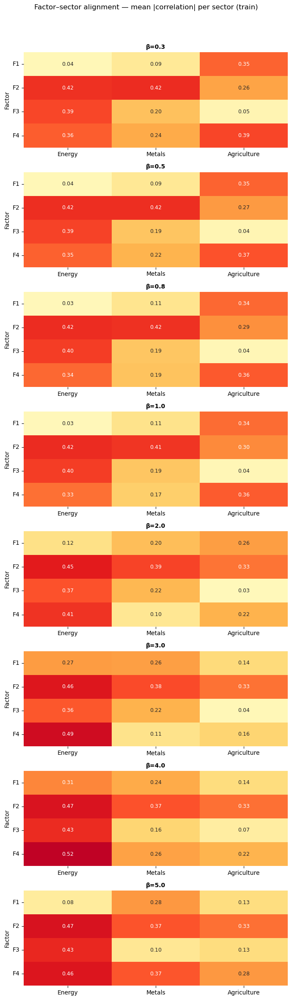

In [15]:
nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(7, 3 * nb))
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    corr = factor_commodity_corr(arch, "train")
    alignment = pd.DataFrame({
        sector: corr[[c for c in COMMODITIES_ORDERED if SECTOR_MAP[c] == sector]].abs().mean(axis=1)
        for sector in SECTOR_ORDER
    })
    sns.heatmap(
        alignment, ax=ax, cmap="YlOrRd", vmin=0, vmax=0.6,
        annot=True, fmt=".2f", annot_kws={"size": 9}, cbar=False,
    )
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor")
    ax.tick_params(axis="y", rotation=0)

fig.suptitle("Factor–sector alignment — mean |correlation| per sector (train)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9d. Cross-beta factor agreement

Do different beta values discover the same 5 factors? Hungarian-algorithm matching on the 5×5 absolute-correlation matrix between any two beta's factor matrices. Score near 1 = same factors found; near 0 = completely different representations.

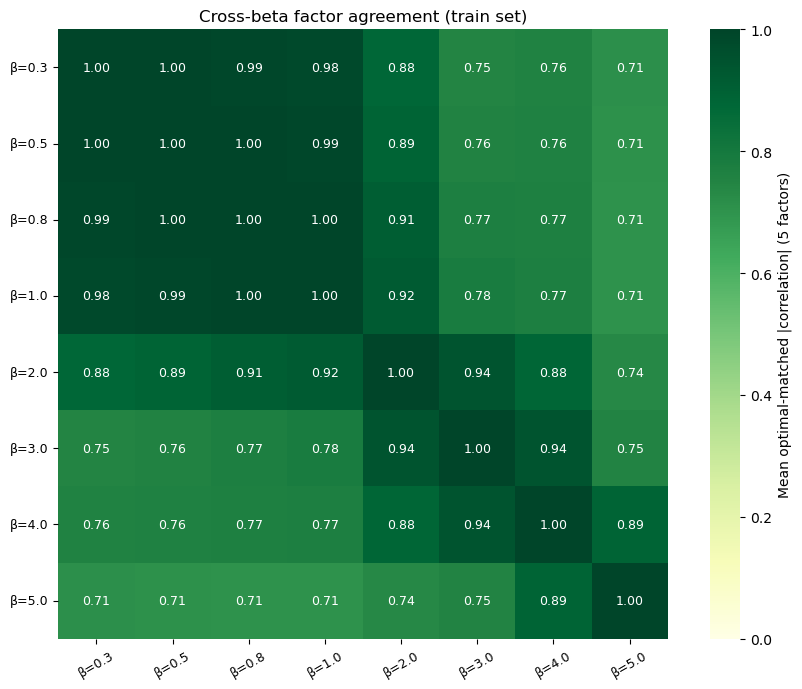

In [16]:
from scipy.optimize import linear_sum_assignment

def _factor_agreement(arch_a, arch_b, split="train"):
    fa = pd.read_csv(FACTORS / f"{arch_a}_{split}_factors.csv", index_col=0, parse_dates=True)
    fb = pd.read_csv(FACTORS / f"{arch_b}_{split}_factors.csv", index_col=0, parse_dates=True)
    common = fa.index.intersection(fb.index)
    fa, fb = fa.loc[common].to_numpy(), fb.loc[common].to_numpy()
    K = fa.shape[1]
    cost = np.array(
        [[abs(float(np.corrcoef(fa[:, i], fb[:, j])[0, 1])) for j in range(K)] for i in range(K)]
    )
    row, col = linear_sum_assignment(-cost)
    return float(cost[row, col].mean())

agree = pd.DataFrame(
    [[_factor_agreement(a, b) for b in BETA_ARCHS] for a in BETA_ARCHS],
    index=beta_labels, columns=beta_labels,
)

fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(
    agree, ax=ax, cmap="YlGn", vmin=0, vmax=1,
    annot=True, fmt=".2f", annot_kws={"size": 9}, square=True,
    cbar_kws={"label": "Mean optimal-matched |correlation| (5 factors)"},
)
ax.set_title("Cross-beta factor agreement (train set)", fontsize=12)
ax.tick_params(axis="x", rotation=30, labelsize=9)
ax.tick_params(axis="y", rotation=0,  labelsize=9)
fig.tight_layout()
plt.show()

### 9e. Factor autocorrelation — temporal persistence

Lag-1 (daily), lag-5 (weekly), lag-21 (monthly) autocorrelation per factor. High autocorrelation → slow macro regime signal. Near zero → fast noise. Watch for autocorrelation collapsing at high β as posterior collapse kills factor dynamics.

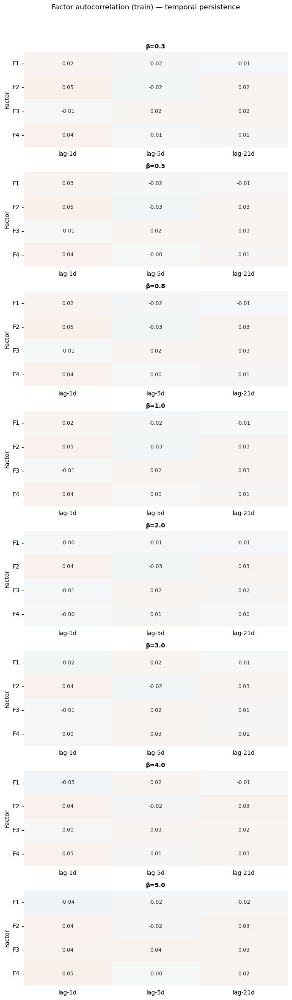

In [17]:
LAGS = [1, 5, 21]

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(7, 3 * nb))
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    factors = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    acorr = pd.DataFrame(
        {f"lag-{lag}d": factors.apply(lambda col: col.autocorr(lag=lag)) for lag in LAGS}
    )
    sns.heatmap(
        acorr, ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
        annot=True, fmt=".2f", annot_kws={"size": 9}, cbar=False,
    )
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor")
    ax.tick_params(axis="y", rotation=0)

fig.suptitle("Factor autocorrelation (train) — temporal persistence", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9f. Rolling factor–commodity correlation (stability)

252-day rolling correlation between each factor and its highest-correlated commodity. Stable lines = factor has a consistent economic interpretation across time. Drifting or flipping lines = the factor mixes signals, especially at high β.

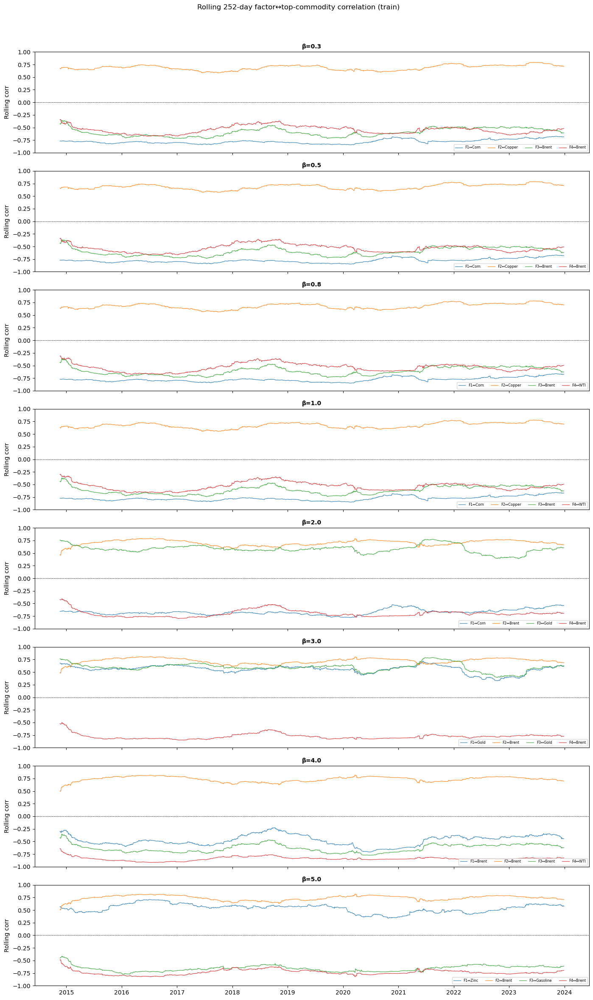

In [18]:
ROLL_WINDOW = 252

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(14, 3 * nb), sharex=True)
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    corr_full = factor_commodity_corr(arch, "train")
    factors   = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    rets      = returns_raw.reindex(factors.index)
    for factor in corr_full.index:
        top_com = corr_full.loc[factor].abs().idxmax()
        rolling = factors[factor].rolling(ROLL_WINDOW).corr(rets[top_com])
        ax.plot(rolling.index, rolling, lw=0.9, alpha=0.85, label=f"{factor}↔{top_com}")
    ax.axhline(0, color="k", lw=0.5, ls="--")
    ax.set_ylim(-1, 1)
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Rolling corr")
    ax.legend(loc="lower right", fontsize=6, ncol=5)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle(f"Rolling {ROLL_WINDOW}-day factor↔top-commodity correlation (train)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9g. Factor behaviour around market events

Factor time series with markers at key commodity market events. Compare how event sensitivity changes across beta values — high β models may show muted responses if factors are collapsed toward the prior.

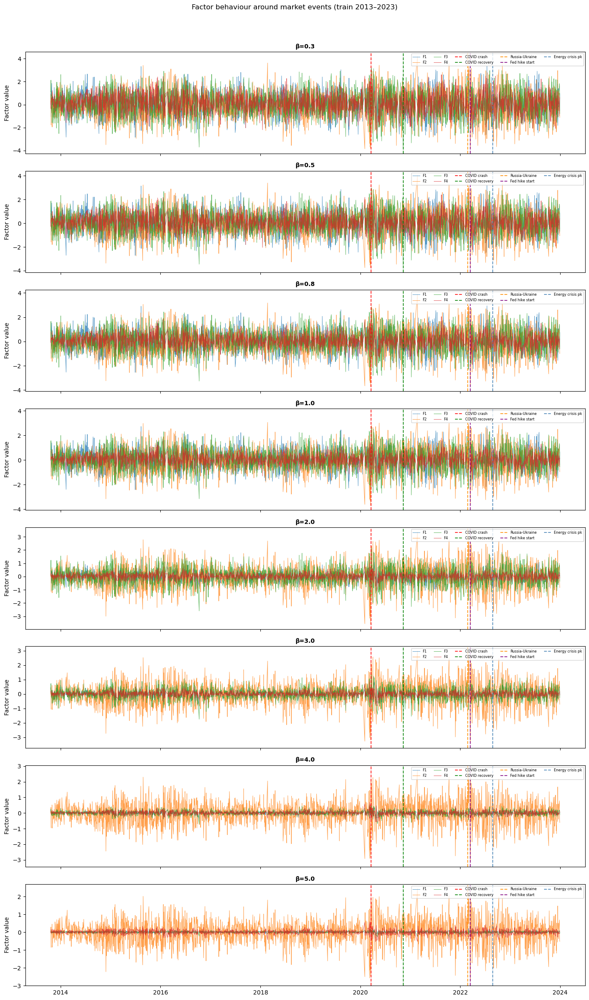

In [19]:
MARKET_EVENTS = {
    "COVID crash":      (pd.Timestamp("2020-03-20"), "red"),
    "COVID recovery":   (pd.Timestamp("2020-11-09"), "green"),
    "Russia-Ukraine":   (pd.Timestamp("2022-02-24"), "darkorange"),
    "Fed hike start":   (pd.Timestamp("2022-03-16"), "purple"),
    "Energy crisis pk": (pd.Timestamp("2022-08-26"), "steelblue"),
}

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(14, 3 * nb), sharex=True)
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    factors = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    for col in factors.columns:
        ax.plot(factors.index, factors[col], lw=0.7, alpha=0.75, label=col)
    for ev_name, (ev_date, ev_col) in MARKET_EVENTS.items():
        if factors.index.min() <= ev_date <= factors.index.max():
            ax.axvline(ev_date, color=ev_col, lw=1.3, ls="--", alpha=0.9, label=ev_name)
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor value")
    ax.legend(loc="upper right", fontsize=6, ncol=5)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle("Factor behaviour around market events (train 2013–2023)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 10. Factor ~ Macro Variable Regressions (One-on-One)

For each beta value, we run a simple OLS regression of each latent factor on each macro variable independently:

> `factor_k_t = α + β · macro_var_t + ε_t`

R² measures how much variance in the factor is explained by a single macro variable. Stars mark significance: `*` p < 0.05, `**` p < 0.01, `***` p < 0.001. Monthly/quarterly series are forward-filled to daily frequency before matching.

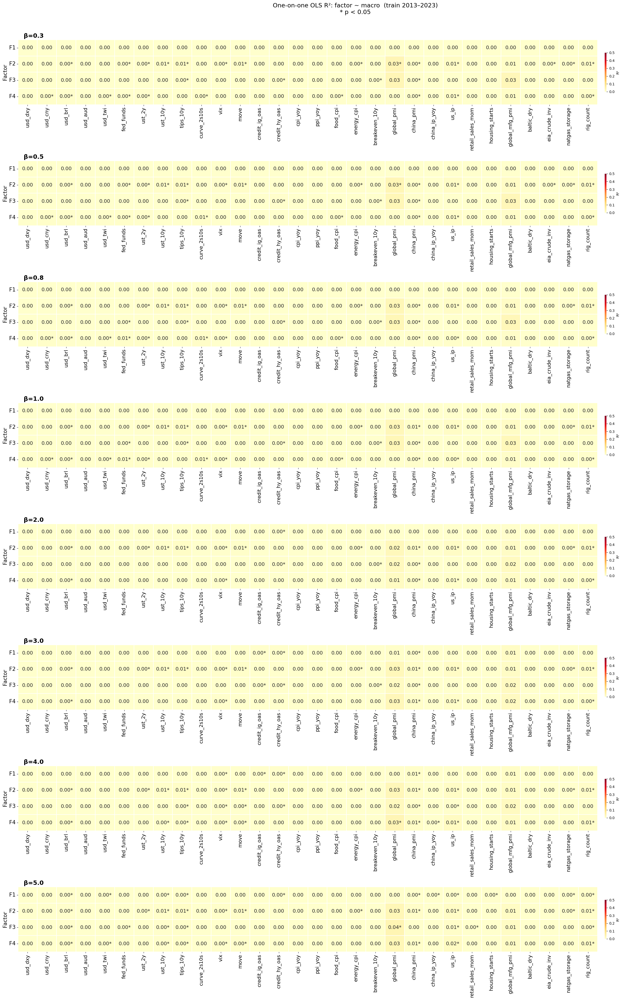

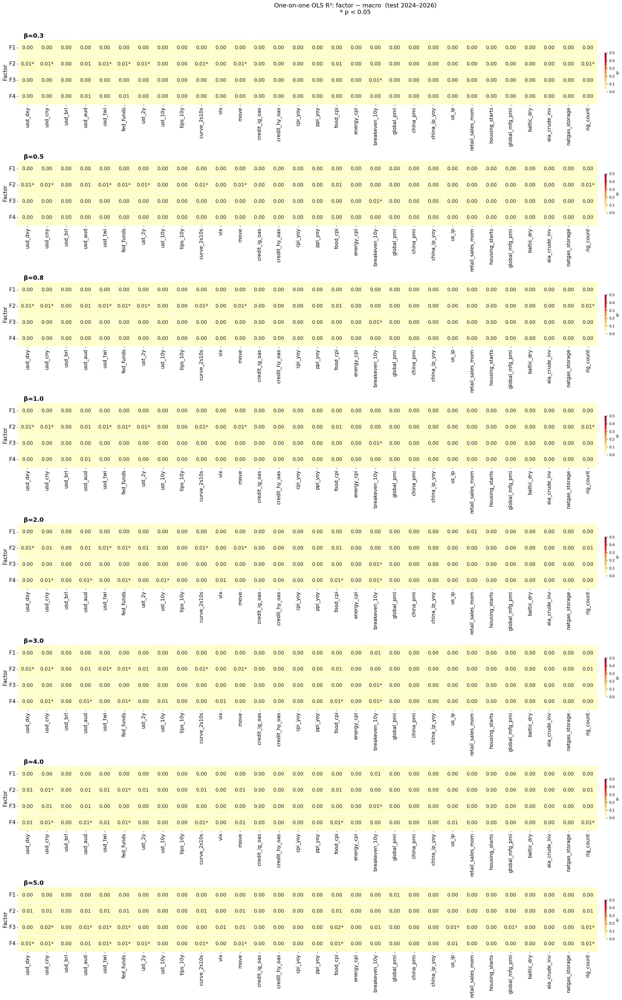


Significant macro predictors per factor  (β=1, train, p < 0.05, ranked by R²)
─────────────────────────────────────────────────────────────────

F1:  — none —

F2:
  us_ip                   R²=0.011  p=0.0000*
  tips_10y                R²=0.009  p=0.0000*
  rig_count               R²=0.007  p=0.0001*
  ust_10y                 R²=0.006  p=0.0001*
  move                    R²=0.006  p=0.0003*
  china_pmi               R²=0.005  p=0.0006*
  vix                     R²=0.003  p=0.0054*
  natgas_storage          R²=0.003  p=0.0147*
  energy_cpi              R²=0.002  p=0.0167*
  usd_brl                 R²=0.002  p=0.0169*
  ust_2y                  R²=0.002  p=0.0206*

F3:
  china_pmi               R²=0.003  p=0.0129*
  credit_hy_oas           R²=0.003  p=0.0156*
  tips_10y                R²=0.002  p=0.0210*
  breakeven_10y           R²=0.002  p=0.0379*
  fed_funds               R²=0.002  p=0.0464*

F4:
  curve_2s10s             R²=0.006  p=0.0003*
  fed_funds               R²=0.005  p=0.000

In [24]:
from scipy.stats import linregress

# Load macro panel and forward-fill monthly/quarterly series to daily
macro_raw = pd.read_csv("../data/macro/macro_panel_raw.csv", index_col=0, parse_dates=True)
macro_ffill = macro_raw.ffill()

# Exclude commodity price series already captured by the VAE
_EXCL = {"wti", "brent", "natgas"}
MACRO_COLS = [c for c in macro_ffill.columns if c not in _EXCL]

def _factor_macro_r2(arch, split):
    """Return (R2, p-value) DataFrame: index=factors, columns=macro vars.
    Regression direction: factor ~ macro_var (macro is X, factor is Y).
    """
    factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
    common  = factors.index.intersection(macro_ffill.index)
    fac     = factors.loc[common]
    mac     = macro_ffill.loc[common, MACRO_COLS]

    r2_mat = pd.DataFrame(index=fac.columns, columns=MACRO_COLS, dtype=float)
    pv_mat = pd.DataFrame(index=fac.columns, columns=MACRO_COLS, dtype=float)

    for factor in fac.columns:
        for col in MACRO_COLS:
            valid = fac[factor].notna() & mac[col].notna()
            if valid.sum() < 30:
                r2_mat.loc[factor, col] = np.nan
                pv_mat.loc[factor, col] = np.nan
                continue
            # X = macro variable, Y = factor
            _, _, r, p, _ = linregress(mac.loc[valid, col], fac.loc[valid, factor])
            r2_mat.loc[factor, col] = r ** 2
            pv_mat.loc[factor, col] = p

    return r2_mat.astype(float), pv_mat.astype(float)


def _sig_stars(p):
    if np.isnan(p): return ""
    return "*" if p < 0.05 else ""


# ── Plot: one heatmap per beta ─────────────────────────────────────────────
for split in ("train", "test"):
    nb   = len(BETA_ARCHS)
    fig, axes = plt.subplots(nb, 1, figsize=(28, 5 * nb))
    if nb == 1:
        axes = [axes]

    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        r2, pv = _factor_macro_r2(arch, split)

        annot = r2.copy().astype(object)
        for f in r2.index:
            for col in r2.columns:
                v = r2.loc[f, col]
                s = _sig_stars(pv.loc[f, col])
                annot.loc[f, col] = f"{v:.2f}{s}" if not np.isnan(v) else ""

        sns.heatmap(
            r2, ax=ax,
            cmap="YlOrRd", vmin=0, vmax=0.5,
            annot=annot, fmt="", annot_kws={"size": 14},
            cbar_kws={"label": "R²", "shrink": 0.6, "pad": 0.01},
            linewidths=0.3, linecolor="white",
        )
        ax.set_title(f"β={beta}", fontsize=17, fontweight="bold", loc="left", x=0.01)
        ax.set_ylabel("Factor", fontsize=15)
        ax.tick_params(axis="x", rotation=90, labelsize=14)
        ax.tick_params(axis="y", rotation=0, labelsize=15)

    year = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(
        f"One-on-one OLS R²: factor ~ macro  ({split} {year})\n"
        "* p < 0.05",
        fontsize=17,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


# ── Table: significant macro predictors per factor (p < 0.05) ─────────────
PREFERRED_BETA = "BetaVAE_b1"
r2_pref, pv_pref = _factor_macro_r2(PREFERRED_BETA, "train")

print(f"\nSignificant macro predictors per factor  (β=1, train, p < 0.05, ranked by R²)\n{'─'*65}")
for factor in r2_pref.index:
    sig = pv_pref.loc[factor].dropna()
    sig = sig[sig < 0.05]
    if sig.empty:
        print(f"\n{factor}:  — none —")
        continue
    ranked = r2_pref.loc[factor, sig.index].sort_values(ascending=False)
    rows = [
        f"  {col:<22}  R²={r2_pref.loc[factor, col]:.3f}  p={pv_pref.loc[factor, col]:.4f}*"
        for col in ranked.index
    ]
    print(f"\n{factor}:")
    print("\n".join(rows))

## 11. Factor Regression Formulas (Factor ~ Commodity Returns)

For each latent factor we run a multivariate OLS against all commodity returns:

> `factor_k = α + β₁·C₁ + β₂·C₂ + ... + β₂₇·C₂₇ + ε`

Only coefficients with p < 0.05 are retained in the displayed formula. R² tells us how much of each factor is explained by commodity returns — this is the economic interpretation of the factor.


════════════════════════════════════════════════════════════════════════════════
  β=0.3  —  Factor regression formulas on commodity returns (train, p < 0.05)
════════════════════════════════════════════════════════════════════════════════

F1 = +0.056  -0.033·WTI  +0.090·NaturalGas  +0.090·Gasoline  +0.043·Diesel  -0.017·ThermalCoal  +0.150·Gold  +0.030·Silver  +0.117·Copper  +0.041·Aluminium  +0.065·Nickel  +0.170·Zinc  +0.072·Platinum  -0.020·SGXIronOre  +0.045·Lithium  -0.076·Coffee  -0.386·Corn  -0.042·Cotton  +0.052·LiveCattle  -0.159·Sugar  -0.282·Soybeans  -0.179·SoybeanOil  -0.320·HRWWheat
  → R²=0.937  adj-R²=0.937  significant predictors: 22

F2 = +0.021  +0.125·Brent  +0.092·WTI  +0.034·NaturalGas  +0.079·Gasoline  +0.063·Diesel  +0.141·HeatingOil  +0.029·ThermalCoal  +0.075·Methanol  +0.154·Gold  +0.246·Silver  +0.214·Copper  +0.159·Aluminium  +0.153·Nickel  +0.155·Zinc  +0.144·Platinum  -0.040·HRCSteel  +0.070·Lithium  +0.077·Coffee  +0.022·Corn  +0.073·Cotton  -0.027·Le

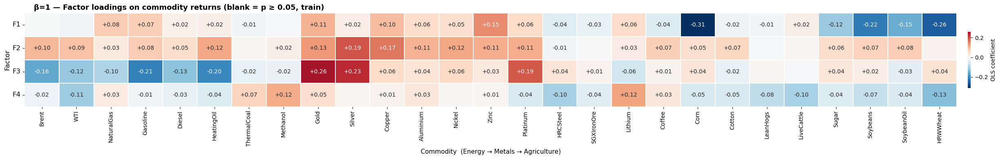


R² summary — how much of each factor is explained by commodity returns



,F1,F2,F3,F4
beta,,,,
0.3,0.937,0.928,0.918,0.933
0.5,0.942,0.934,0.923,0.939
0.8,0.947,0.941,0.928,0.945
1.0,0.949,0.944,0.931,0.947
2.0,0.960,0.953,0.949,0.937
3.0,0.957,0.955,0.960,0.942
4.0,0.920,0.955,0.952,0.936
5.0,0.720,0.953,0.857,0.934


In [25]:
import statsmodels.api as sm

def _factor_ols(arch, split):
    """
    For each factor, run OLS: factor_k ~ all commodity returns.
    Returns a dict keyed by factor name, each value is a statsmodels RegressionResults.
    """
    factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
    rets    = returns_raw.reindex(factors.index)[COMMODITIES_ORDERED].dropna(how="all")
    common  = factors.index.intersection(rets.index)
    Y = factors.loc[common]
    X = sm.add_constant(rets.loc[common])

    results = {}
    for factor in Y.columns:
        y = Y[factor]
        valid = X.notna().all(axis=1) & y.notna()
        results[factor] = sm.OLS(y[valid], X[valid]).fit()
    return results


def _format_formula(factor, res, pval_thresh=0.05):
    """Print a readable regression equation keeping only significant terms."""
    params = res.params
    pvals  = res.pvalues
    sig    = pvals[pvals < pval_thresh].index.tolist()

    terms = []
    # intercept
    if "const" in sig:
        terms.append(f"{params['const']:+.3f}")
    # commodity terms
    for col in [c for c in sig if c != "const"]:
        terms.append(f"{params[col]:+.3f}·{col}")

    if not terms:
        formula = f"{factor} = [no significant predictors]"
    else:
        formula = f"{factor} = " + "  ".join(terms)

    r2     = res.rsquared
    adj_r2 = res.rsquared_adj
    n_sig  = len([c for c in sig if c != "const"])
    return formula, r2, adj_r2, n_sig


# ── Print formulas for every beta (train set) ──────────────────────────────
for arch, beta in zip(BETA_ARCHS, BETAS):
    res_dict = _factor_ols(arch, "train")
    print(f"\n{'═'*80}")
    print(f"  β={beta}  —  Factor regression formulas on commodity returns (train, p < 0.05)")
    print(f"{'═'*80}")
    for factor, res in res_dict.items():
        formula, r2, adj_r2, n_sig = _format_formula(factor, res)
        print(f"\n{formula}")
        print(f"  → R²={r2:.3f}  adj-R²={adj_r2:.3f}  significant predictors: {n_sig}")


# ── Coefficient heatmap for preferred beta ─────────────────────────────────
print(f"\n\n{'═'*80}")
print(f"  Coefficient heatmap  —  β=1  (train, all commodities; blank = p ≥ 0.05)")
print(f"{'═'*80}\n")

PREFERRED_BETA = "BetaVAE_b1"
res_dict = _factor_ols(PREFERRED_BETA, "train")

coef_df = pd.DataFrame(
    {f: res.params.drop("const") for f, res in res_dict.items()},
    index=COMMODITIES_ORDERED,
).T

pval_df = pd.DataFrame(
    {f: res.pvalues.drop("const") for f, res in res_dict.items()},
    index=COMMODITIES_ORDERED,
).T

# Mask insignificant cells
annot = coef_df.copy().astype(object)
for f in coef_df.index:
    for col in coef_df.columns:
        v = coef_df.loc[f, col]
        p = pval_df.loc[f, col]
        annot.loc[f, col] = f"{v:+.2f}" if p < 0.05 else ""

fig, ax = plt.subplots(figsize=(28, 4))
sns.heatmap(
    coef_df, ax=ax,
    cmap="RdBu_r", center=0,
    annot=annot, fmt="", annot_kws={"size": 10},
    cbar_kws={"label": "OLS coefficient", "shrink": 0.6, "pad": 0.01},
    linewidths=0.3, linecolor="white",
)
ax.set_title(
    "β=1 — Factor loadings on commodity returns (blank = p ≥ 0.05, train)",
    fontsize=13, fontweight="bold", loc="left", x=0.01,
)
ax.set_xlabel("Commodity  (Energy → Metals → Agriculture)", fontsize=11)
ax.set_ylabel("Factor", fontsize=12)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.tick_params(axis="y", rotation=0, labelsize=12)
fig.tight_layout()
plt.show()

# ── R² summary table ───────────────────────────────────────────────────────
print("\nR² summary — how much of each factor is explained by commodity returns\n")
rows = []
for arch, beta in zip(BETA_ARCHS, BETAS):
    rd = _factor_ols(arch, "train")
    row = {"beta": beta}
    for f, res in rd.items():
        row[f] = round(res.rsquared, 3)
    rows.append(row)

r2_summary = pd.DataFrame(rows).set_index("beta")
display(r2_summary)